In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import umap
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv("data/umap_more_sampling.csv", skiprows=6)

In [3]:
df[::8]

,[run number],decay-aw,alpha-aw,%awareness-cte,alpha-unaw,decay-unaw,%unawareness-cte,[step],count turtles with [ susceptible? ]
0,11,1.0,0.0,0.0,0.0,0.0,0.0,1000,1459
8,7,0.6,0.0,0.0,0.0,0.0,0.0,1000,1477
16,16,0.4,0.1,0.0,0.0,0.0,0.0,1000,1628
24,24,0.1,0.2,0.0,0.0,0.0,0.0,1000,1539
32,30,0.7,0.2,0.0,0.0,0.0,0.0,1000,1673
...,...,...,...,...,...,...,...,...,...
1581192,1581193,0.8,0.7,1.0,1.0,1.0,1.0,1000,470
1581200,1581199,0.3,0.8,1.0,1.0,1.0,1.0,1000,255
1581208,1581210,0.3,0.9,1.0,1.0,1.0,1.0,1000,266
1581216,1581216,0.9,0.9,1.0,1.0,1.0,1.0,1000,888


/home/abernardin/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


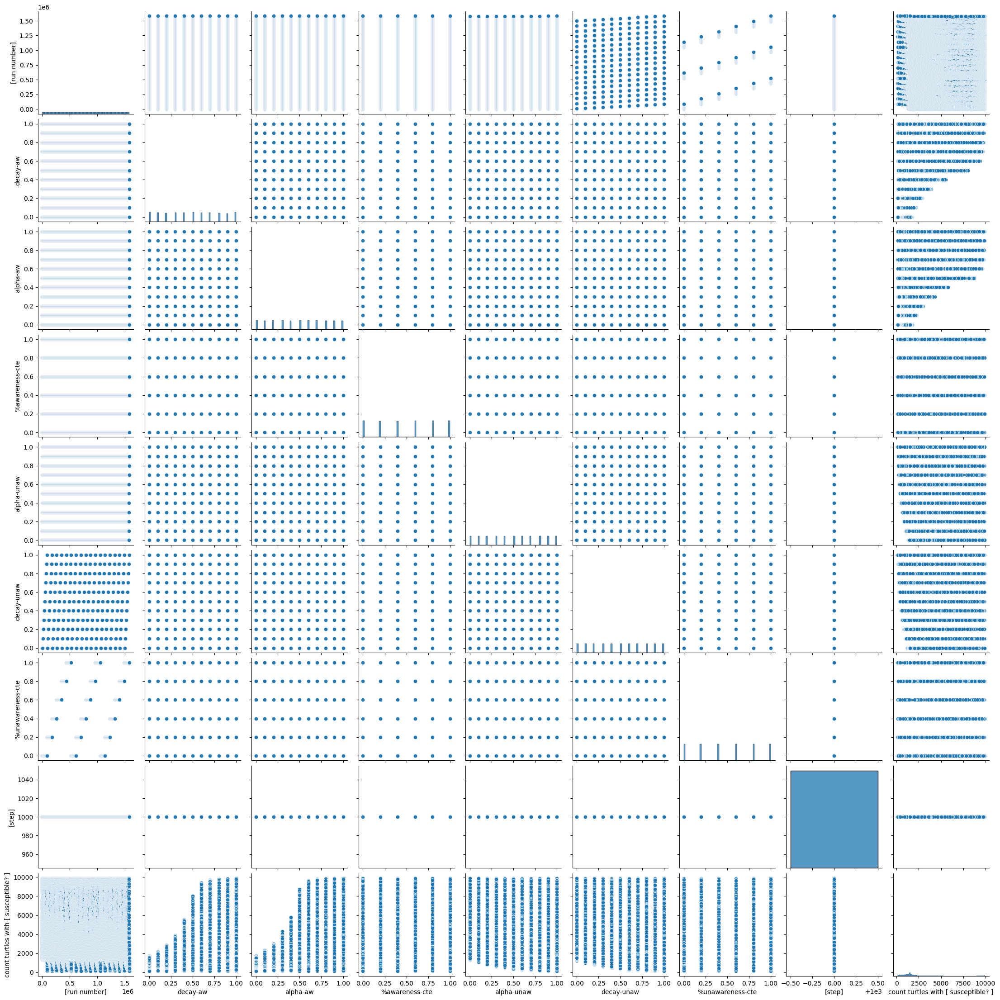

In [5]:
sns.pairplot(df[::6])

## Creating Umap
These instruction and code is based from https://umap-learn.readthedocs.io/en/latest/basic_usage.html

Here theres is a good document to understand and interpret umap https://pair-code.github.io/understanding-umap/

In [4]:
reducer = umap.UMAP(n_neighbors=30, min_dist=0.3, verbose=True, random_state=3) # 15 and 0.1 original values
#reducer = umap.UMAP(n_neighbors=30, min_dist=0.3, verbose=True) # 15 and 0.1 original values

In [5]:
df_values = df[::8][['decay-aw', 'alpha-aw', '%awareness-cte', 'alpha-unaw', # original
#df_values = df[::4][['decay-aw', 'alpha-aw', '%awareness-cte', 'alpha-unaw', 
        'decay-unaw', '%unawareness-cte',
       'count turtles with [ susceptible? ]']].values
        #]].values

scaled_df_values = StandardScaler().fit_transform(df_values)

In [6]:
scaled_df_values

array([[ 1.58302831, -1.58134574, -1.46356577, ..., -1.58111843,
        -1.4638408 , -0.35722023],
       [ 0.31918381, -1.58134574, -1.46356577, ..., -1.58111843,
        -1.4638408 , -0.34926289],
       [-0.31273843, -1.26515881, -1.46356577, ..., -1.58111843,
        -1.4638408 , -0.28250961],
       ...,
       [-0.62869956,  1.26433657,  1.46376719, ...,  1.58116643,
         1.46385265, -0.88461533],
       [ 1.26706719,  1.26433657,  1.46376719, ...,  1.58116643,
         1.46385265, -0.60964488],
       [ 0.63514494,  1.58052349,  1.46376719, ...,  1.58116643,
         1.46385265, -0.72148977]])

In [7]:
%%time
embedding = reducer.fit_transform(scaled_df_values)
#embedding = reducer.fit_transform(df_values)
embedding.shape

/home/abernardin/anaconda3/lib/python3.11/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


UMAP(min_dist=0.3, n_neighbors=30, random_state=3, verbose=True)
Thu Mar 28 16:06:09 2024 Construct fuzzy simplicial set
Thu Mar 28 16:06:09 2024 Finding Nearest Neighbors
Thu Mar 28 16:06:09 2024 Building RP forest with 27 trees
Thu Mar 28 16:06:12 2024 NN descent for 18 iterations
	 1  /  18
	 2  /  18
	Stopping threshold met -- exiting after 2 iterations
Thu Mar 28 16:06:25 2024 Finished Nearest Neighbor Search
Thu Mar 28 16:06:28 2024 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Thu Mar 28 16:09:01 2024 Finished embedding
CPU times: user 5min 4s, sys: 6.86 s, total: 5min 10s
Wall time: 2min 52s


(197654, 2)

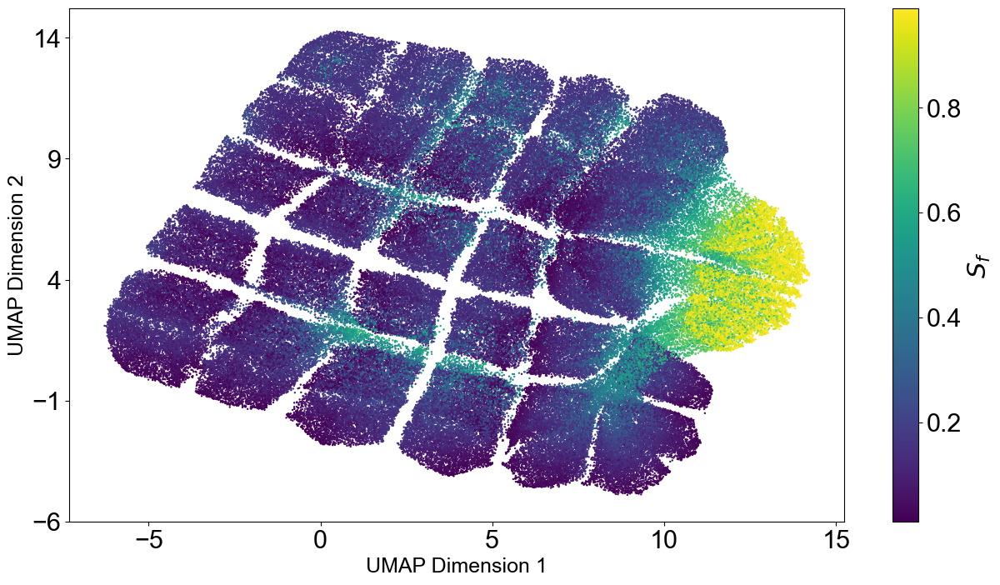

CPU times: user 5.53 s, sys: 16 ms, total: 5.54 s
Wall time: 5.53 s


In [8]:
%%time
plt.rcParams['figure.figsize'] = 15, 8
plt.rcParams['font.family'] = 'sans-serif'  # Set the default font to Courier for all text in the plot
plt.rcParams['font.size'] = 22  # Increase the base font size
plt.rcParams['font.sans-serif'] = ['Arial']  # Specify Arial as the first choice for sans-serif



# For colouring the dots in the plot
susceptible_array = df[::8][['count turtles with [ susceptible? ]']].values/10000
#susceptible_array = df[['alpha-unaw']].values


plt.scatter(embedding[::,0], embedding[::,1], c=susceptible_array[::,0], s=0.5)
plt.colorbar(label=r'$S_f$')

# Get current y-axis limits
ymin, ymax = 14, -6
plt.xticks([-5, 0, 5, 10, 15])


# Set new y-ticks at regular intervals within the current y-axis limits
plt.yticks(np.linspace(ymin, ymax, num=5))  # Adjust 'num' to change the number of ticks

#plt.title("UMAP projection")
plt.xlabel("UMAP Dimension 1", fontsize=18)  # X-axis label
plt.ylabel("UMAP Dimension 2", fontsize=18)  # Y-axis label



# Save the figure as a TIFF file with Courier font
#plt.savefig('fig4.tiff', format='tiff')
plt.savefig('images/fig4.jpg', format='jpg', dpi=300)

plt.show()

decay-aw


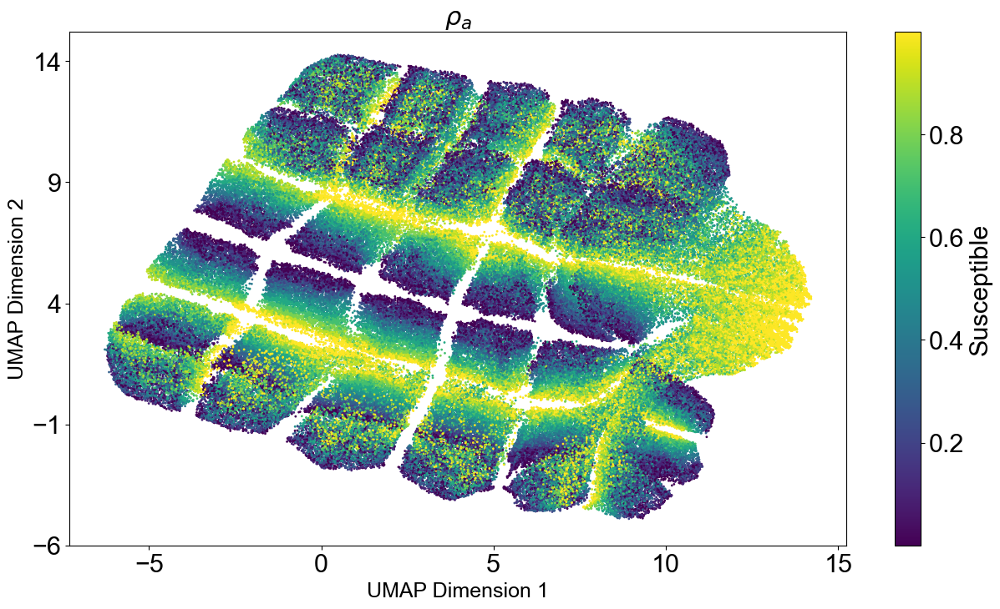

alpha-aw


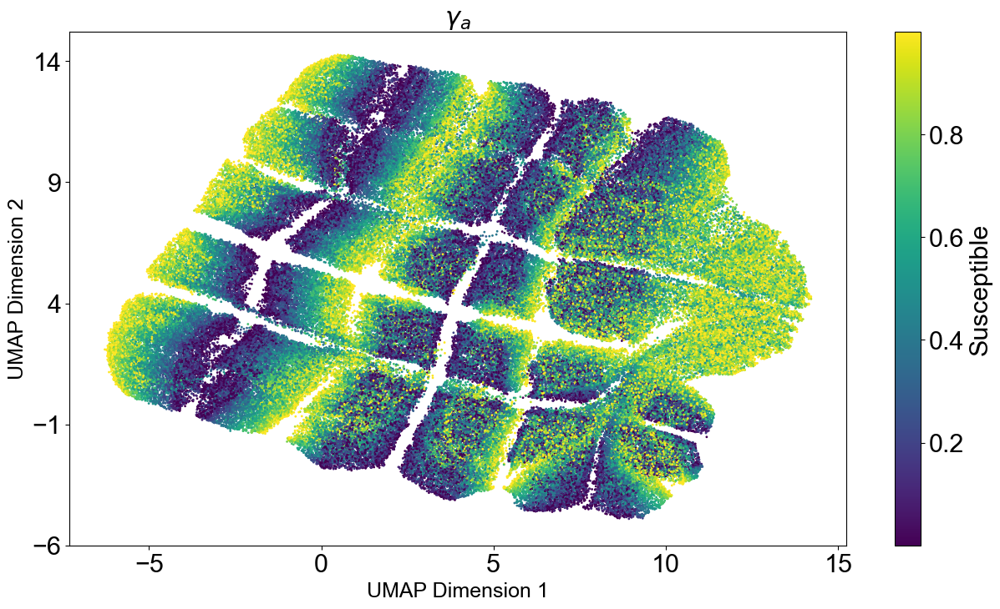

%awareness-cte


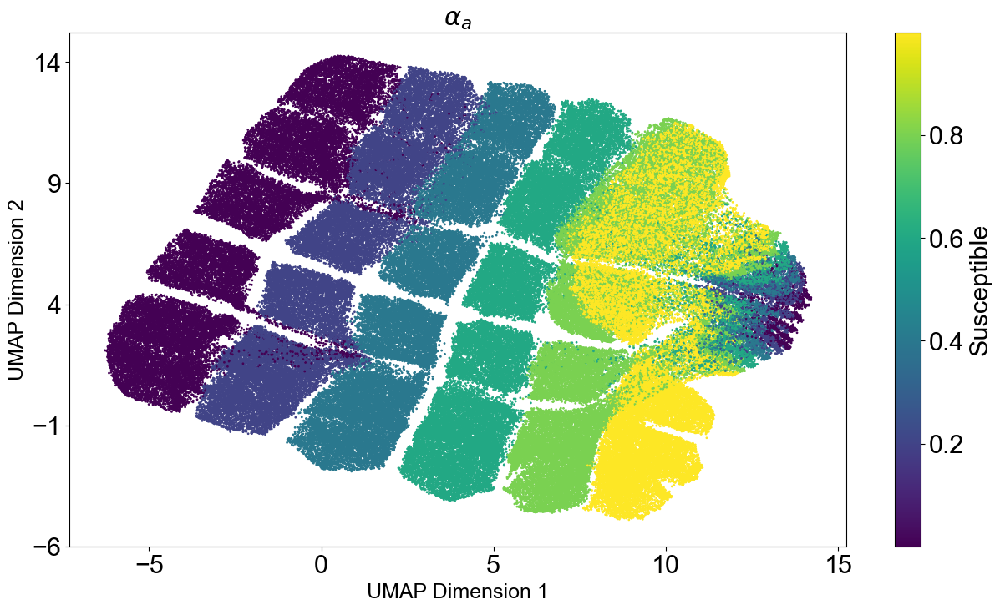

alpha-unaw


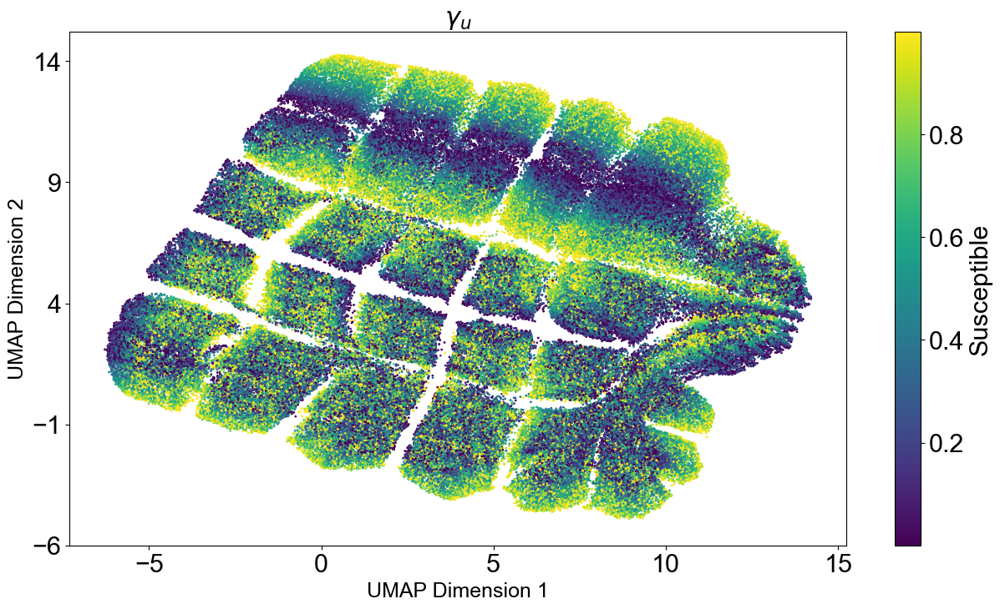

decay-unaw


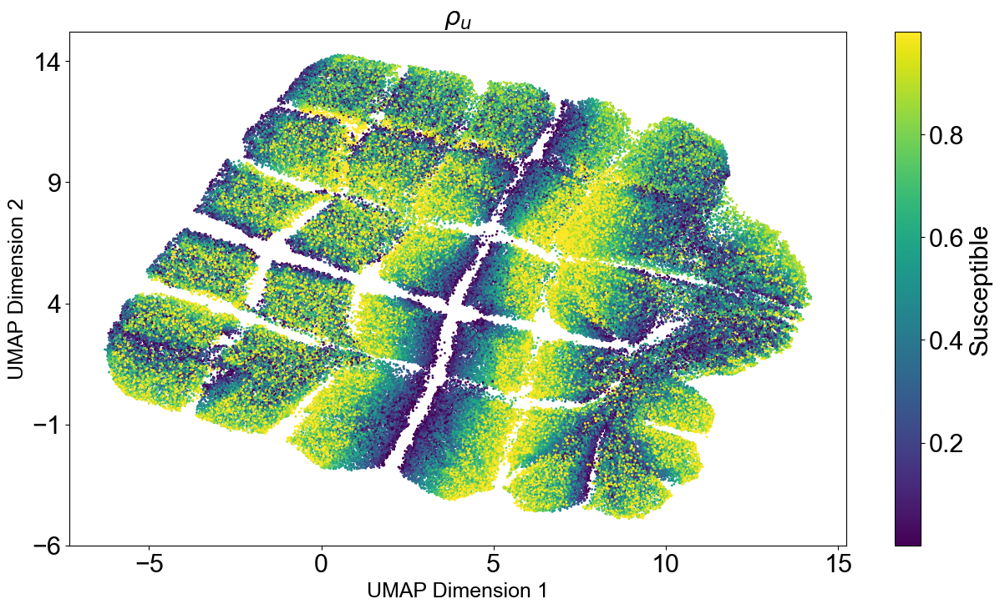

%unawareness-cte


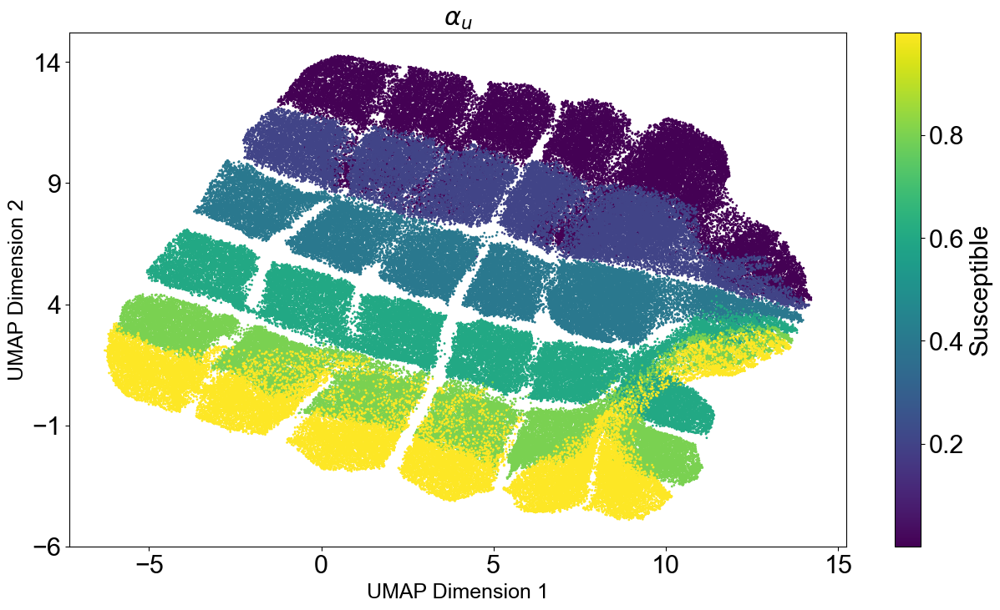

In [38]:
#plt.rcParams['figure.figsize'] = 15, 8

#parameter_array = ['$\rho_a$', '$\gamma_a$', '$\alpha_a$','$\rho_u$','$\gamma_u$', '$\alpha_u$']

title_map = {
    'decay-aw': r'$\rho_a$',
    'alpha-aw': r'$\gamma_a$',
    '%awareness-cte': r'$\alpha_a$',
    'decay-unaw': r'$\rho_u$',
    'alpha-unaw': r'$\gamma_u$',
    '%unawareness-cte': r'$\alpha_u$'
}

for parameter in df.columns:
    if parameter == '[run number]' or parameter == '[step]' or parameter == 'count turtles with [ susceptible? ]':
        pass
    else:
        # For colouring the dots in the plot
        parameter_array = df[::8][[parameter]].values
        print(parameter)

        #plt.scatter(embedding[::,0], embedding[::,1], c=parameter_array[::,0], s=1)
        scatter = plt.scatter(embedding[::,0], embedding[::,1], c=parameter_array, s=1)
        cbar = plt.colorbar(scatter, ticks=[0.2, 0.4, 0.6, 0.8],label='Susceptible')  # Set colorbar ticks

        #plt.colorbar()
        # Get current y-axis limits
        ymin, ymax = 14, -6

        # Set new y-ticks at regular intervals within the current y-axis limits
        plt.yticks(np.linspace(ymin, ymax, num=5))  # Adjust 'num' to change the number of ticks
        
        #plt.title("{}".format(parameter))
        plt.title(title_map.get(parameter, "Unknown Parameter"), fontsize=22)

        plt.xlabel("UMAP Dimension 1", fontsize=18)  # X-axis label
        plt.ylabel("UMAP Dimension 2", fontsize=18)  # Y-axis label
        
        #plt.savefig('{}.jpg'.format(title_map.get(parameter, "Unknown Parameter")), format='jpg', dpi=300)
        plt.show()

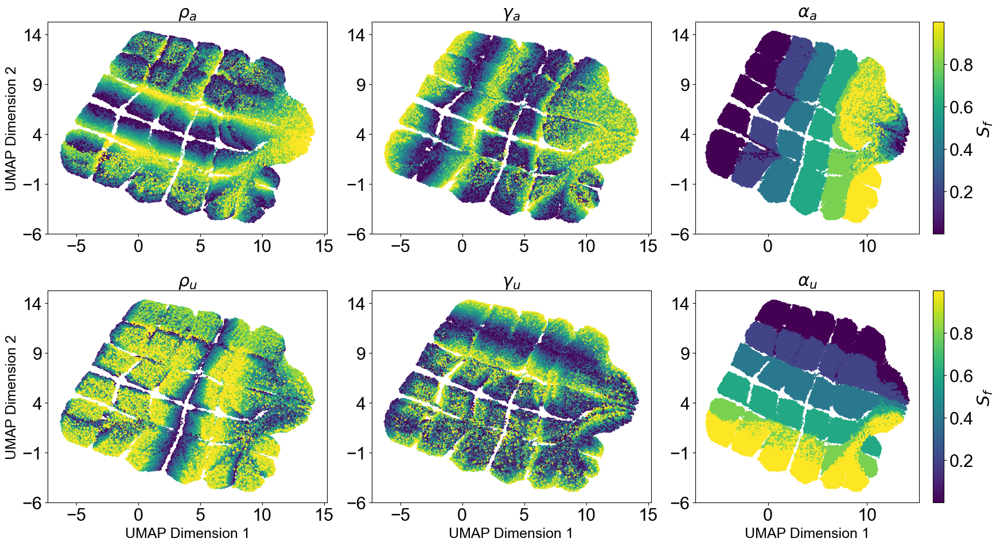

In [11]:
import matplotlib.pyplot as plt
import numpy as np

# Set overall figure size
plt.rcParams['figure.figsize'] = (15, 8)

title_map = {
    'decay-aw': r'$\rho_a$',
    'alpha-aw': r'$\gamma_a$',
    '%awareness-cte': r'$\alpha_a$',
    'decay-unaw': r'$\rho_u$',
    'alpha-unaw': r'$\gamma_u$',
    '%unawareness-cte': r'$\alpha_u$'
}

# Create a figure and a grid of subplots
fig, axs = plt.subplots(2, 3, figsize=(18, 10))  # 2 rows, 3 columns

# Flatten the array of axes to easily iterate over it
axs = axs.flatten()

# Iterate over parameters and their corresponding axes
for idx, (parameter, title) in enumerate(title_map.items()):
    ax = axs[idx]
    if parameter in ['[run number]', '[step]', 'count turtles with [ susceptible? ]']:
        ax.set_visible(False)  # Hides the subplot if the parameter is not to be plotted
        continue

    # For colouring the dots in the plot
    parameter_array = df[::8][[parameter]].values

    # Plot on the specified subplot axis
    scatter = ax.scatter(embedding[:, 0], embedding[:, 1], c=parameter_array, s=1)
    
    # Conditionally add colorbar to the 3rd and 6th subplots
    if idx in [2, 5]:
        cbar = fig.colorbar(scatter, ax=ax, ticks=[0.2, 0.4, 0.6, 0.8])
        cbar.set_label(r'$S_f$')
    
    # Set title for each subplot
    ax.set_title(title, fontsize=22)

    # Conditionally set axis labels
    if idx not in [0, 1, 2]:  # Remove x-axis label for the first row
        ax.set_xlabel("UMAP Dimension 1", fontsize=18)
    if idx not in [1, 2, 4, 5]:  # Remove y-axis label for specified figures
        ax.set_ylabel("UMAP Dimension 2", fontsize=18)

    # Set y-ticks for each subplot; adjust range and number as needed
    ymin, ymax = 14, -6
    ax.set_yticks(np.linspace(ymin, ymax, num=5))

# Adjust layout to prevent overlap
plt.tight_layout()

# After your plotting loop, adjust subplot parameters
# This is a generic adjustment. You might need to experiment with the values
#plt.subplots_adjust(left=0.01, right=0.99, top=0.99, bottom=0.01, wspace=0.2, hspace=0.2)


# Save the entire figure
#plt.savefig('umap_plots.jpg', format='jpg', dpi=300)
plt.savefig('images/umap_plots-colorbar.jpg', format='jpg', dpi=300)

# Show the plot
plt.show()

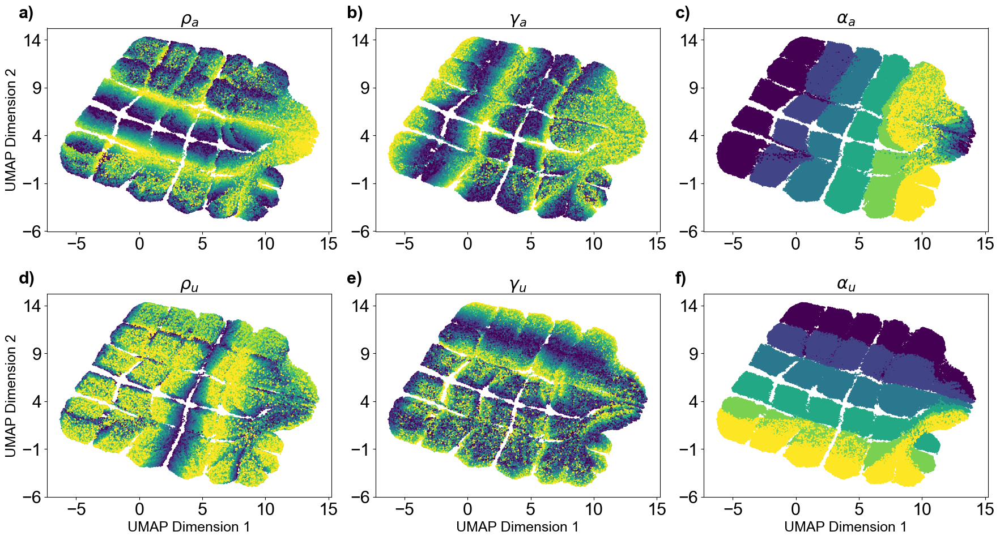

In [66]:
import matplotlib.pyplot as plt
import numpy as np

# Set overall figure size
plt.rcParams['figure.figsize'] = (15, 8)

title_map = {
    'decay-aw': r'$\rho_a$',
    'alpha-aw': r'$\gamma_a$',
    '%awareness-cte': r'$\alpha_a$',
    'decay-unaw': r'$\rho_u$',
    'alpha-unaw': r'$\gamma_u$',
    '%unawareness-cte': r'$\alpha_u$'
}

# Create a figure and a grid of subplots
fig, axs = plt.subplots(2, 3, figsize=(18, 10))  # 2 rows, 3 columns

# Flatten the array of axes to easily iterate over it
axs = axs.flatten()

# Letters for each figure
letters = ['a)', 'b)', 'c)', 'd)', 'e)', 'f)']

# Iterate over parameters and their corresponding axes
for idx, (parameter, title) in enumerate(title_map.items()):
    ax = axs[idx]
    if parameter in ['[run number]', '[step]', 'count turtles with [ susceptible? ]']:
        ax.set_visible(False)  # Hides the subplot if the parameter is not to be plotted
        continue

    # For colouring the dots in the plot
    parameter_array = df[::8][[parameter]].values

    # Plot on the specified subplot axis
    scatter = ax.scatter(embedding[:, 0], embedding[:, 1], c=parameter_array, s=1)
    
    # Add letter to the figure
    ax.text(-0.1, 1.05, letters[idx], transform=ax.transAxes, size=22, weight='bold')
    
    # Set title for each subplot
    ax.set_title(title, fontsize=22)

    # Conditionally set axis labels
    if idx not in [0, 1, 2]:  # Remove x-axis label for the first row
        ax.set_xlabel("UMAP Dimension 1", fontsize=18)
    if idx not in [1, 2, 4, 5]:  # Remove y-axis label for specified figures
        ax.set_ylabel("UMAP Dimension 2", fontsize=18)

    # Set y-ticks for each subplot; adjust range and number as needed
    ymin, ymax = 14, -6
    ax.set_yticks(np.linspace(ymin, ymax, num=5))

# Adjust layout to prevent overlap
plt.tight_layout()

# Save the entire figure
plt.savefig('images/umap_plots.jpg', format='jpg', dpi=300)

plt.show()

In [ ]:
# Now we plot only when rho_u>rho_a (when fake news have a bigger impact than true news)

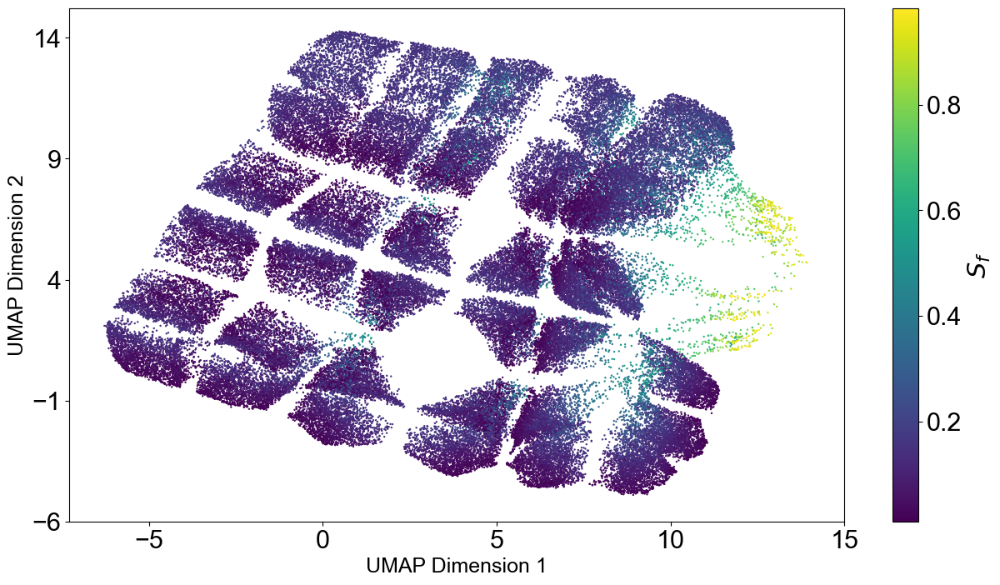

In [9]:
# Filter the DataFrame for 'decay-aw' < 'decay-unaw'
filtered_indices = df['decay-aw'] < df['decay-unaw']

# Downsample filtered data to match the downsampling in UMAP calculation
filtered_indices_downsampled = filtered_indices[::8]

# Get the 'count turtles with [ susceptible? ]' values for coloring
susceptible_array = df[::8][filtered_indices_downsampled]['count turtles with [ susceptible? ]'].values/10000

# Plot the filtered data points with specific coloring
plt.scatter(embedding[filtered_indices_downsampled, 0], embedding[filtered_indices_downsampled, 1], 
            c=susceptible_array, s=0.5, cmap='viridis', label="Filtered: 'decay-aw' < 'decay-unaw'")

# Add colorbar and legend
plt.colorbar(label=r'$S_f$')
#plt.legend()
#plt.title("UMAP projection highlighting 'decay-aw' < 'decay-unaw'")
#plt.title("'decay-aw' < 'decay-unaw'")

# Get current y-axis limits
ymin, ymax = 14, -6

# Get current y-axis limits
xmin, xmax = 14, -6

# Set new y-ticks at regular intervals within the current y-axis limits
plt.yticks(np.linspace(ymin, ymax, num=5))  # Adjust 'num' to change the number of ticks
#plt.xticks(np.linspace(xmin, xmax, num=5))  # Adjust 'num' to change the number of ticks
plt.xticks([-5, 0, 5, 10, 15])


#plt.title("UMAP projection")
plt.xlabel("UMAP Dimension 1", fontsize=18)  # X-axis label
plt.ylabel("UMAP Dimension 2", fontsize=18)  # Y-axis label



# Save the figure as a TIFF file with Courier font
#plt.savefig('fig4.tiff', format='tiff')
plt.savefig('images/fig5.jpg', format='jpg', dpi=300)


plt.show()

decay-aw


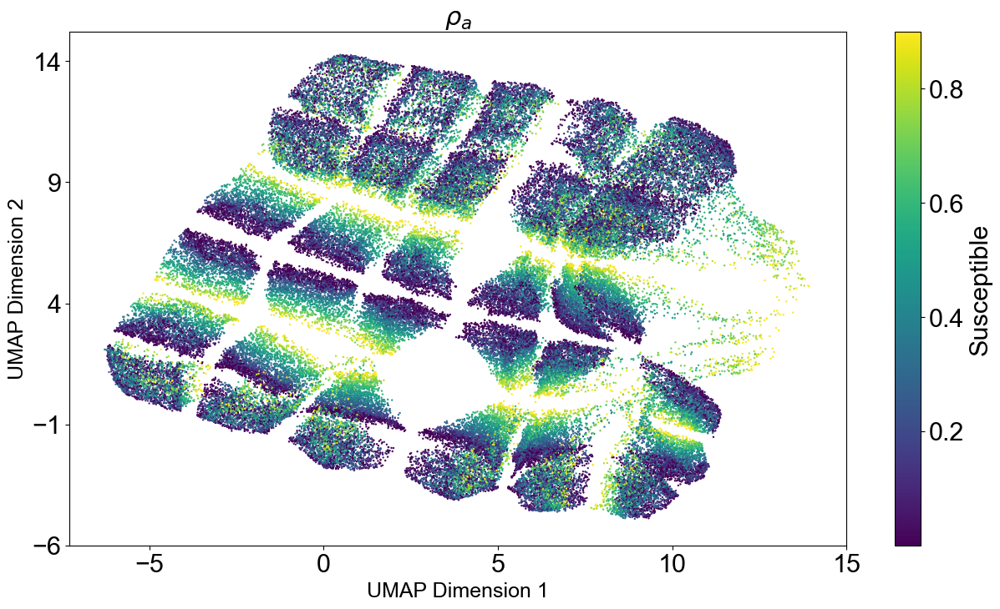

alpha-aw


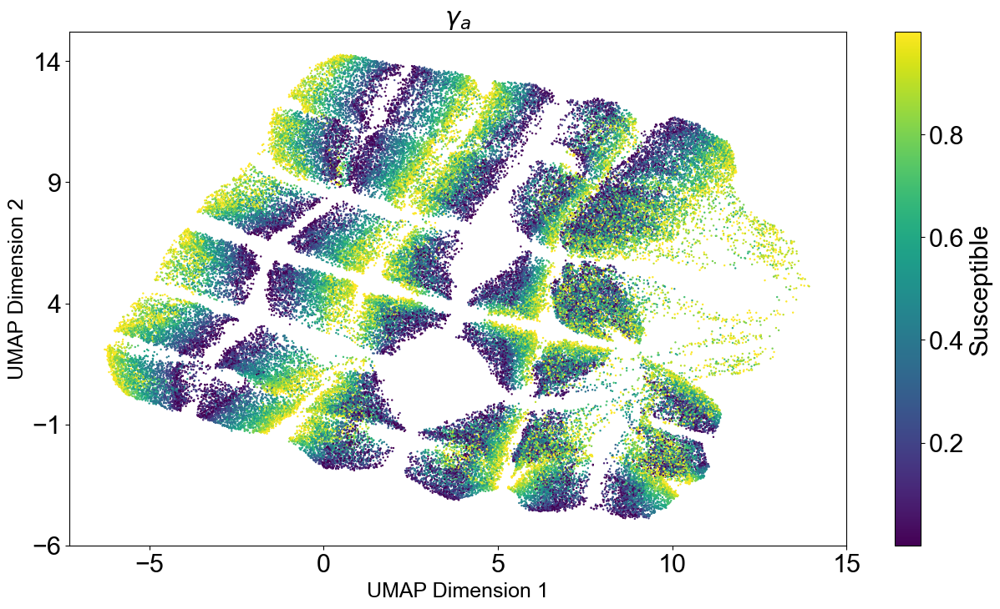

%awareness-cte


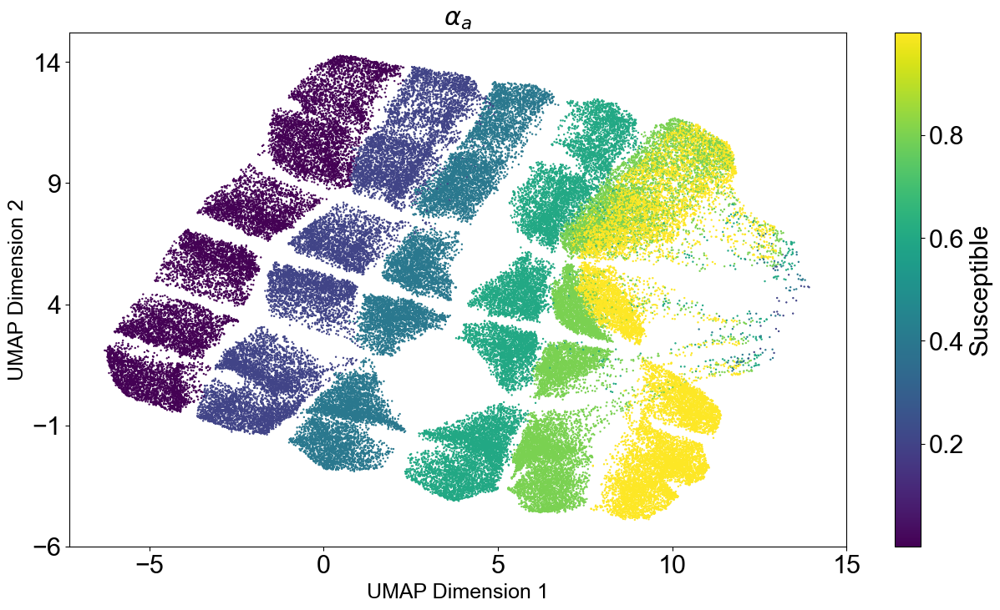

alpha-unaw


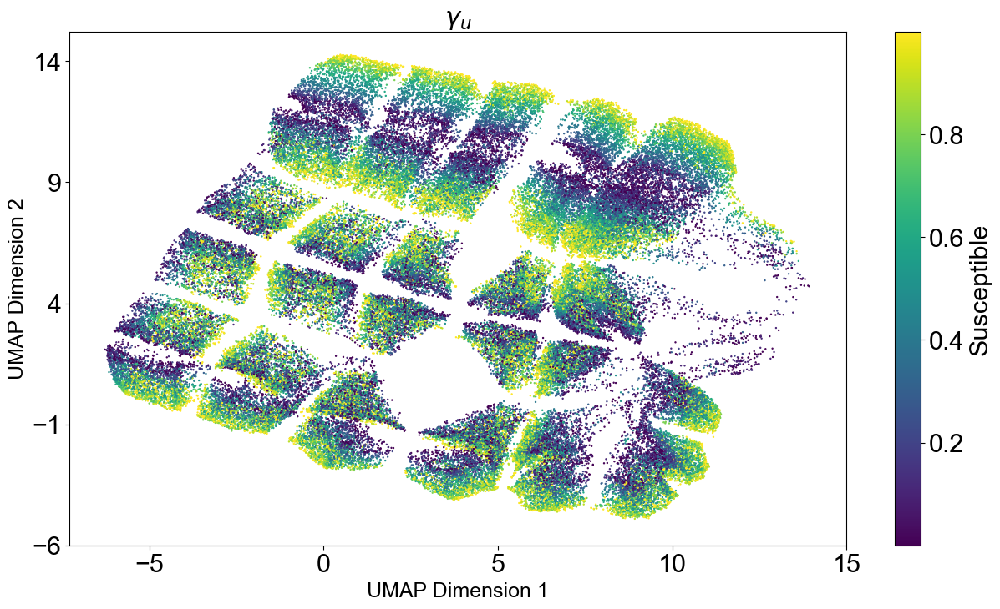

decay-unaw


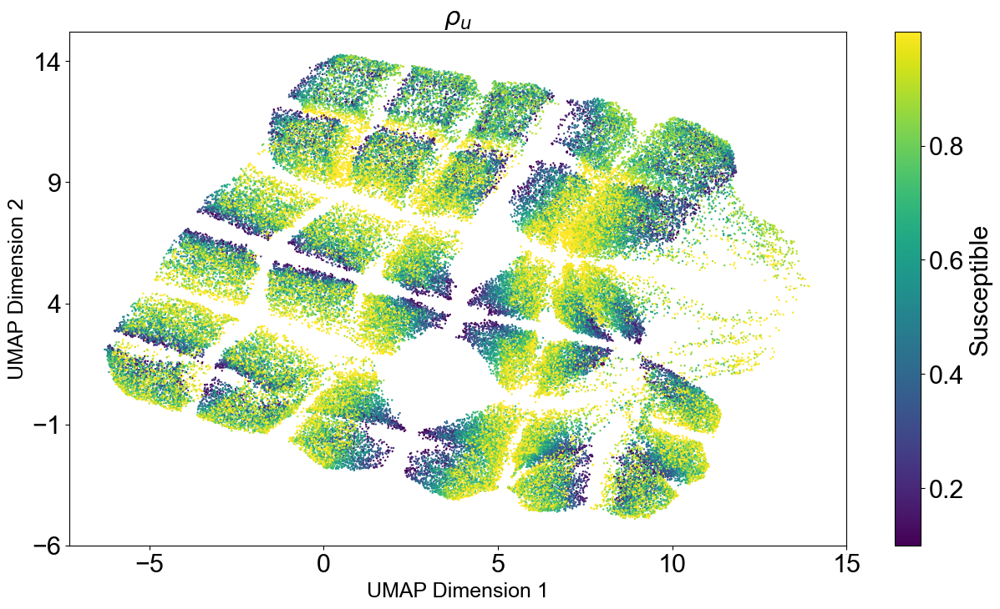

%unawareness-cte


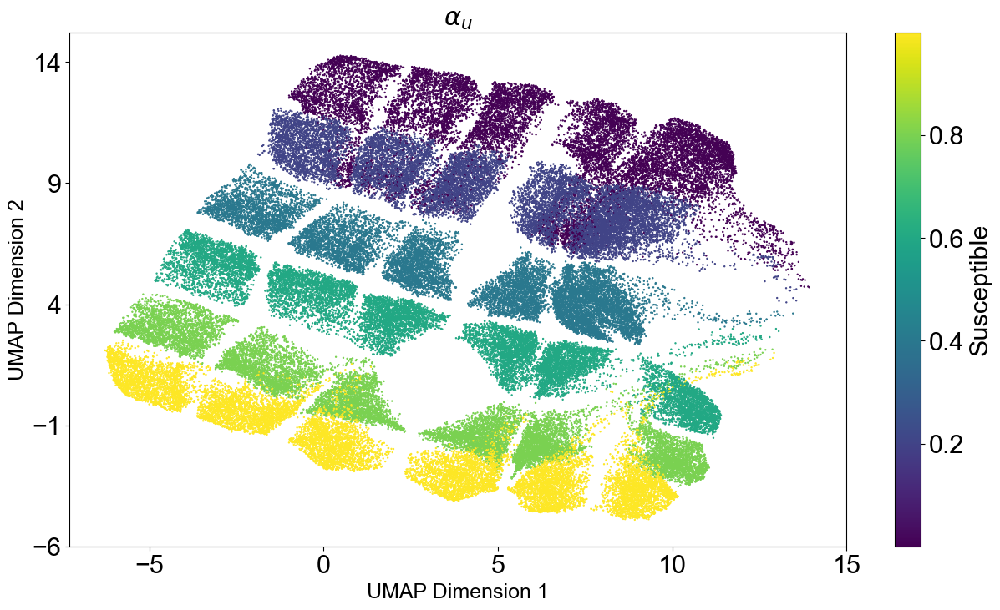

count turtles with [ susceptible? ]


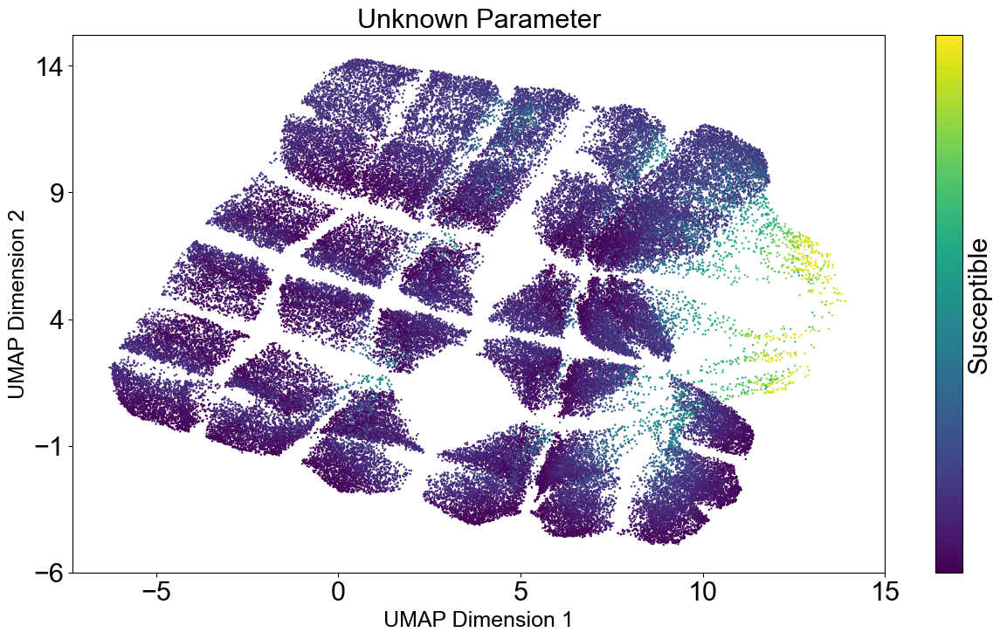

In [37]:
title_map = {
    'decay-aw': r'$\rho_a$',
    'alpha-aw': r'$\gamma_a$',
    '%awareness-cte': r'$\alpha_a$',
    'decay-unaw': r'$\rho_u$',
    'alpha-unaw': r'$\gamma_u$',
    '%unawareness-cte': r'$\alpha_u$'
}

for parameter in df.columns:
    if parameter == '[run number]' or parameter == '[step]':
        pass
    else:
        # Get the 'count turtles with [ susceptible? ]' values for coloring
        susceptible_array = df[::8][filtered_indices_downsampled][parameter].values
        print(parameter)
        # Plot the filtered data points with specific coloring
        scatter = plt.scatter(embedding[filtered_indices_downsampled, 0], embedding[filtered_indices_downsampled, 1], 
                    c=susceptible_array, s=0.5, cmap='viridis', label="Filtered: 'decay-aw' < 'decay-unaw'")
        cbar = plt.colorbar(scatter, ticks=[0.2, 0.4, 0.6, 0.8],label='Susceptible')  # Set colorbar ticks

        
        # Get current y-axis limits
        ymin, ymax = 14, -6

        # Set new y-ticks at regular intervals within the current y-axis limits
        plt.yticks(np.linspace(ymin, ymax, num=5))  # Adjust 'num' to change the number of ticks
        plt.xticks([-5, 0, 5, 10, 15])
        
        #plt.title("{}".format(parameter))
        plt.title(title_map.get(parameter, "Unknown Parameter"), fontsize=22)

        plt.xlabel("UMAP Dimension 1", fontsize=18)  # X-axis label
        plt.ylabel("UMAP Dimension 2", fontsize=18)  # Y-axis label
        
        #plt.savefig('{}_red_line.jpg'.format(title_map.get(parameter, "Unknown Parameter")), format='jpg', dpi=300)
        
        # Add colorbar and legend
        #plt.colorbar(label='Susceptible')
        #plt.legend()
        #plt.title("UMAP 'decay-aw' < 'decay-unaw' for {}".format(parameter))
        plt.show()

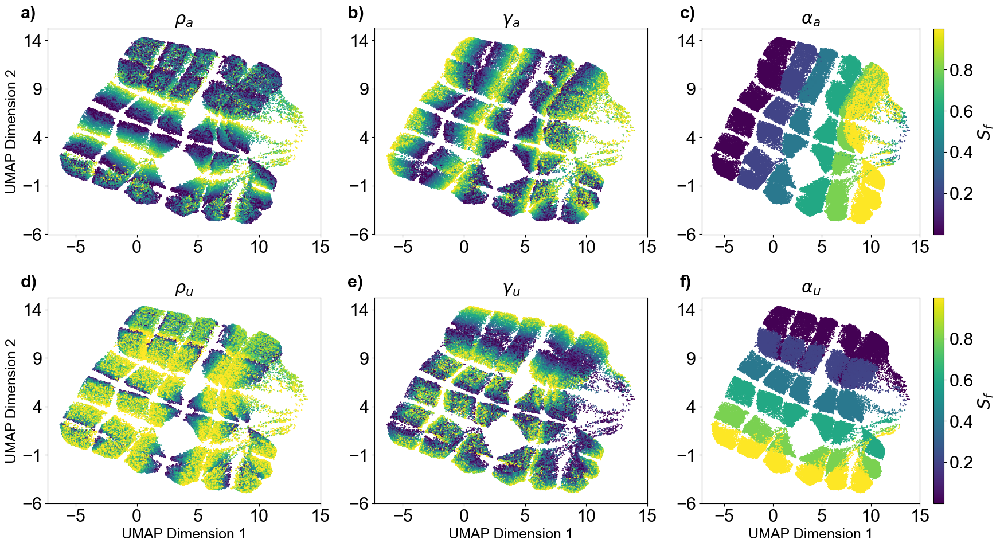

In [10]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming 'df', 'embedding', and 'filtered_indices_downsampled' are predefined

title_map = {
    'decay-aw': r'$\rho_a$',
    'alpha-aw': r'$\gamma_a$',
    '%awareness-cte': r'$\alpha_a$',
    'decay-unaw': r'$\rho_u$',
    'alpha-unaw': r'$\gamma_u$',
    '%unawareness-cte': r'$\alpha_u$'
}

# Create a figure and a grid of subplots
fig, axs = plt.subplots(2, 3, figsize=(18, 10))  # 2 rows, 3 columns

# Flatten the array of axes for easier iteration
axs = axs.flatten()

# Letters for each figure
letters = ['a)', 'b)', 'c)', 'd)', 'e)', 'f)']

# Iterate over parameters and their corresponding axes
for idx, (parameter, title) in enumerate(title_map.items()):
    ax = axs[idx]
    if parameter in ['[run number]', '[step]']:
        ax.set_visible(False)  # Hides the subplot if the parameter is not to be plotted
        continue

    # Get the 'count turtles with [ susceptible? ]' values for coloring
    susceptible_array = df[::8][filtered_indices_downsampled][parameter].values

    # Plot the filtered data points with specific coloring on the respective subplot axis
    scatter = ax.scatter(embedding[filtered_indices_downsampled, 0], embedding[filtered_indices_downsampled, 1], 
                    c=susceptible_array, s=0.5, cmap='viridis')
    
    # Add letter to the figure
    ax.text(-0.1, 1.05, letters[idx], transform=ax.transAxes, size=22, weight='bold')
    
    # Conditionally add colorbar to the 3rd and 6th subplots
    if idx in [2, 5]:
        cbar = fig.colorbar(scatter, ax=ax, ticks=[0.2, 0.4, 0.6, 0.8])
        cbar.set_label(r'$S_f$')
    
    # Set title for each subplot
    ax.set_title(title, fontsize=22)

    # Conditionally set axis labels
    if idx not in [0, 1, 2]:  # Remove x-axis label for the first row
        ax.set_xlabel("UMAP Dimension 1", fontsize=18)
    if idx not in [1, 2, 4, 5]:  # Remove y-axis label for specified figures
        ax.set_ylabel("UMAP Dimension 2", fontsize=18)
    
    ax.set_yticks(np.linspace(ymin, ymax, num=5))  # Adjust y-ticks
    ax.set_xticks([-5, 0, 5, 10, 15])  # Set x-ticks as specified

# Adjust layout to prevent overlap
plt.tight_layout()

# Save the entire figure
#plt.savefig('umap_plots_red_line.jpg', format='jpg', dpi=300)
plt.savefig('images/umap_plots_red_line-colorbar.jpg', format='jpg', dpi=300)

# Show the plot
plt.show()